<a href="https://colab.research.google.com/github/zzbn12345/FCIC24_Workshop_AI/blob/main/Lecture2_Social_and_Spatial_Network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# COMPUATIONAL RESEARCH METHODS FOR THE BUILT ENVIRONMENT

## Lecture 2: Social and Spatial Networks in the Built Environment
Dr. Nan BAI

24 April 2024, Trial Lecture AE+T Sector Plan

Postdoc Research Fellow in Data Science and Artificial Intelligence | Public Administration and Policy Group | Wageningen University & Research

Guest Researcher | Marie Sklodowska-Curie Early-Stage Researcher | Department of Architectural Engineering + Technology | Delft University of Technology

### Introduction

This is a Python notebook hosted on Google Colab that you can follow to reproduce many of the results presented during the **Lecture 2 Social and Spatial Networks in the Built Environment**.

You have the chance to bring in your own case-study city and collect your own network datasets in ready-to-use formats for further research and heritage investigations. You can try to represent the city as a graph, and find out the nodes with the highest degrees and other centrality metrics.

You probably need some knowledge in programming to understand what happens in each part. However, it does not matter that much if you do not. Just walk through all the steps and you will at least have some interesting results at hand.

After this lecture, you will have the:
* **[Knowledge]** to describe a social network of people in space and a spatial network in the built environment (building/cities) using the terminology of network **centrality** analysis

* **[Skills]** to construct a social or a spatial network and represent the network structure that can be understood by computers

* **[Attitude]** to prepare spatial network models for describing the urban built heritage using computational tools

### Basic Settings and Preparations

#### Imports and Installations

In [1]:
!pip install osmnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.4/107.4 kB 2.7 MB/s eta 0:00:00


In [2]:
# imports the various library for the lab
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import osmnx as ox # this line imports osmnx
import networkx as nx # this line imports networkx
import matplotlib.cm as cm
import matplotlib.colors as colors
import pickle

from argparse import Namespace
import urllib
import pathlib
from google.colab import userdata
from google.colab import drive
#from IPython.display import IFrame
#ox.config(log_console=True, use_cache=True)

import sys
print (f'current environment: {sys.prefix}')

current environment: /usr


In [3]:
print (f'current osmnx version: {ox.__version__}')

current osmnx version: 1.9.2


In [4]:
import geopandas as gpd
print (f'current geopandas version: {gpd.__version__}')

current geopandas version: 0.13.2


#### Mounting Google Drive

In [5]:
drive.mount('/content/drive')

Mounted at /content/drive


After mounting to the Google Drive, you can see its folders by clicking on the Files tab on the left of the Colab notebook. You can also access your downloaded data later.

#### Making a Folder for this Workshop

First tell us how you would love to call your case study city! Please do not use any space in the name. Next time you can also change this case name for another case study that you are interested in.

In [6]:
case_name = 'Delf Campus'

Let's make a new folder in your Google Drive for the rest of this project

In [7]:
folder = '/content/drive/MyDrive/FCIC_workshop/' + case_name + '/'
pathlib.Path(folder).mkdir(parents=True, exist_ok=True)

#### User Inputs

In [8]:
args = Namespace(
    # Please paste the geolocation of your case study city here
    lat = 52.00667,
    lon = 4.3556,
    # The radius is in the unit of km
    radius = 1,
    save_dir = folder,
)

In [9]:
args.save_dir

'/content/drive/MyDrive/FCIC_workshop/Delf Campus/'

### Data Collection

#### Introducing OSMnx

OSMnx, or **"OpenStreetMap network"**, is a Python package for downloading administrative boundary shapes and street networks from OpenStreetMap. It allows you to easily construct, project, visualize, and analyze complex street networks in Python with NetworkX.

For instance, you could easily get a city’s or neighborhood’s walking, driving, or biking network with a single line of Python code. Then you can simply visualize cul-de-sacs or one-way streets, plot shortest-path routes, or calculate stats like intersection density, average node connectivity, degree distributions, or closeness and betweenness centrality. These are all really useful techniques in research of built environment.

**If you are interested to read more about the package, here are some links:**

* Boeing, G. 2017. [“OSMnx: New Methods for Acquiring, Constructing, Analyzing, and Visualizing Complex Street Networks.” Computers, Environment and Urban Systems. 65, 126-139.](https://geoffboeing.com/publications/osmnx-complex-street-networks/)

* [Web Article - OSMnx: Python for Street Networks](https://geoffboeing.com/2016/11/osmnx-python-street-networks/)

* And for more practice, please see the the [many examples provided from Geoff Boeing](https://github.com/gboeing/osmnx-examples/).

#### Downloading the Spatial Network in a City

##### All network

In [21]:
G = ox.graph_from_point((args.lat, args.lon), dist=args.radius * 1500, network_type='all')
G_proj = ox.projection.project_graph(G, to_latlong=True)

In [51]:
tags={'amenity': True, 'highway':True, 'landuse':True, 'building':True, 'waterway': True, 'railway': True}
all_geom=ox.features.features_from_point((args.lat, args.lon),  tags, dist=args.radius * 1500)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


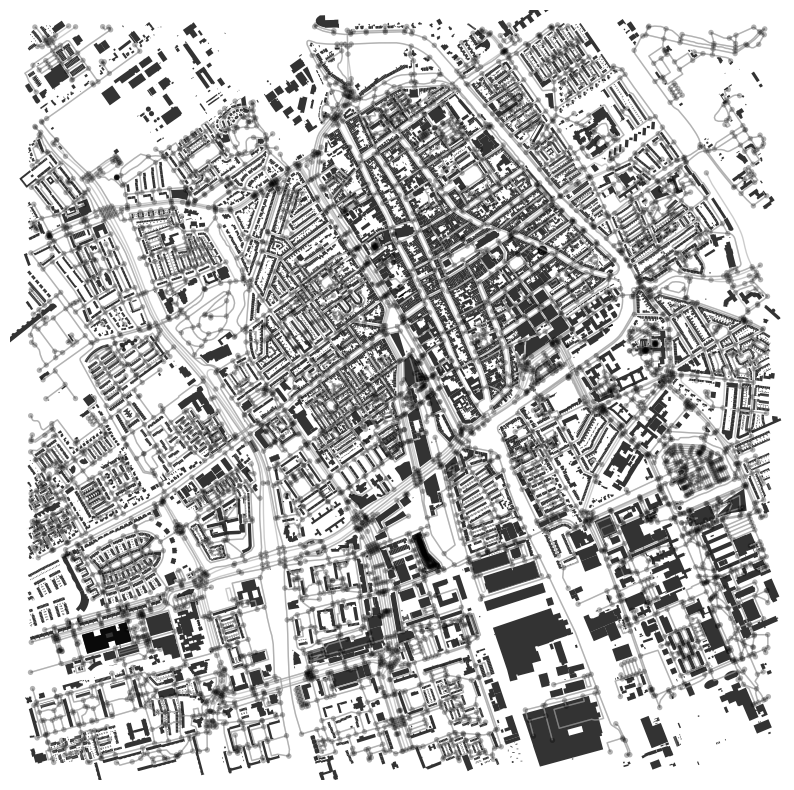

In [23]:
fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['building'].notna()].plot(ax=ax,color='black', alpha=0.8)
ox.plot_graph(G_proj, figsize=(10, 10), bgcolor='w', node_color='k', node_alpha = 0.3, edge_alpha = 0.5, ax=ax, show=False)

plt.axis('off')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


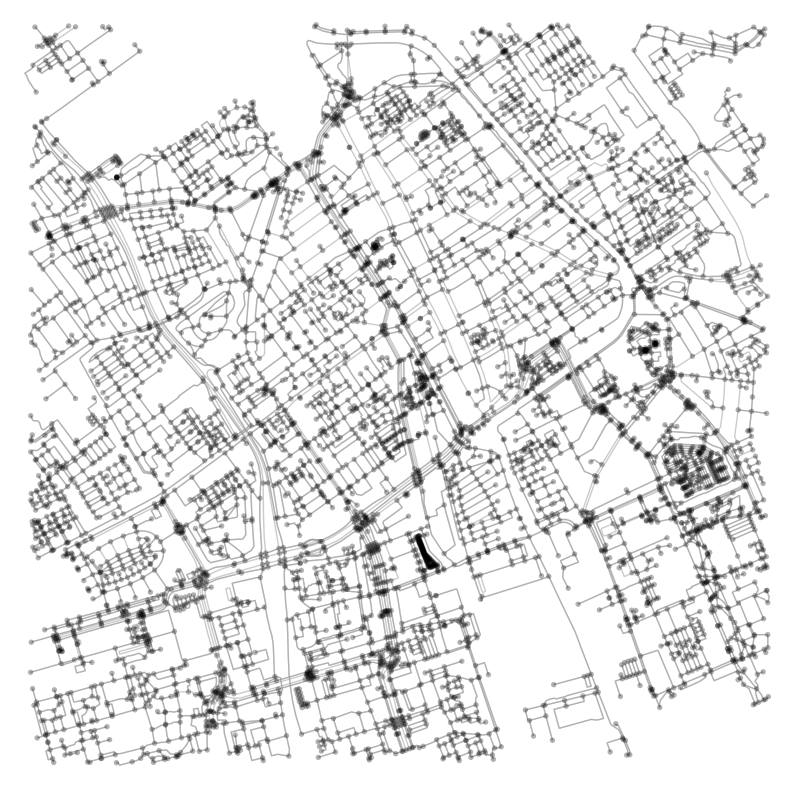

In [24]:
fig,ax = plt.subplots(figsize=(10,10))
ox.plot_graph(G_proj, figsize=(10, 10), bgcolor='w', node_color='k', node_alpha = 0.3, edge_alpha = 0.5, ax=ax, show=False)

plt.axis('off')
plt.show()

##### Bike Network

In [25]:
G_bike = ox.graph_from_point((args.lat, args.lon), dist=args.radius * 1500, network_type='bike')
G_bike_proj = ox.projection.project_graph(G_bike, to_latlong=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


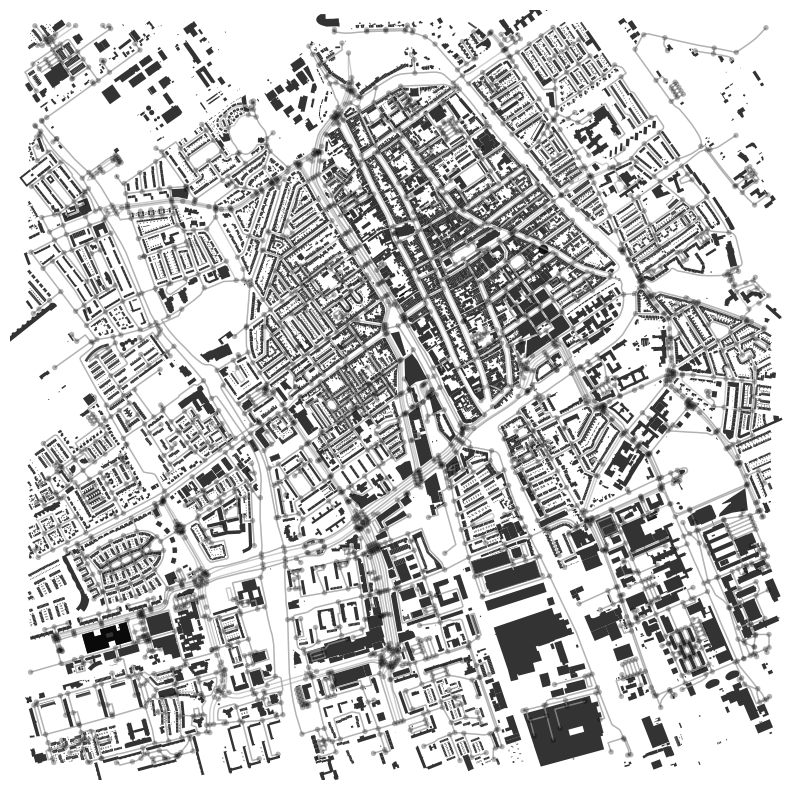

In [26]:
fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['building'].notna()].plot(ax=ax,color='black', alpha=0.8)
ox.plot_graph(G_bike_proj, figsize=(10, 10), bgcolor='w', node_color='k', node_alpha = 0.3, edge_alpha = 0.5, ax=ax, show=False)

plt.axis('off')
plt.show()

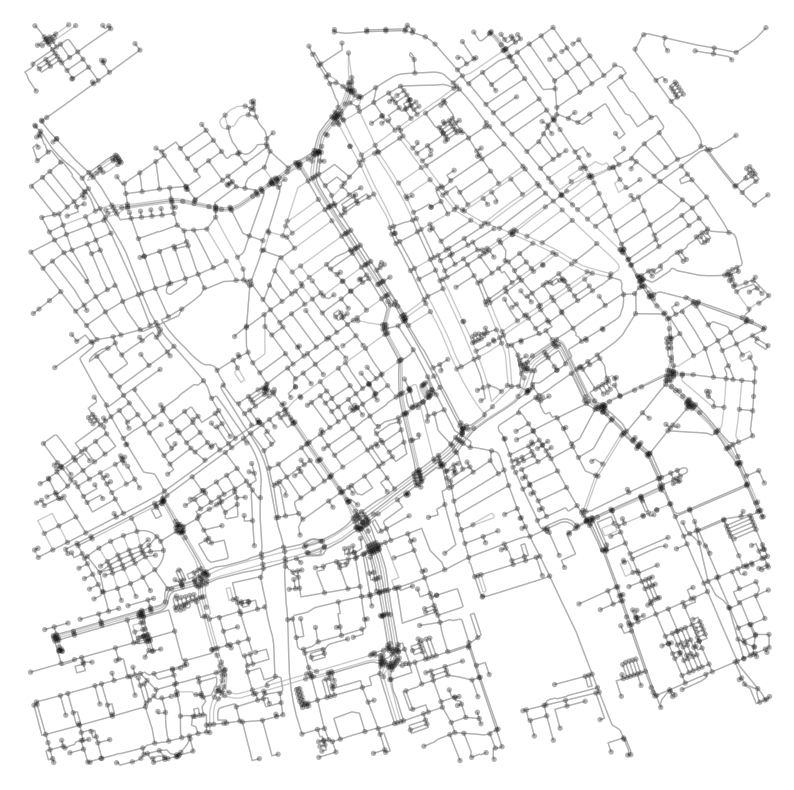

In [27]:
fig,ax = plt.subplots(figsize=(10,10))
ox.plot_graph(G_bike_proj, figsize=(10, 10), bgcolor='w', node_color='k', node_alpha = 0.3, edge_alpha = 0.5, ax=ax, show=False)

plt.axis('off')
plt.show()

##### Drive Network

In [28]:
G_drive = ox.graph_from_point((args.lat, args.lon), dist=args.radius * 1500, network_type='drive')
G_drive_proj = ox.projection.project_graph(G_bike, to_latlong=True)

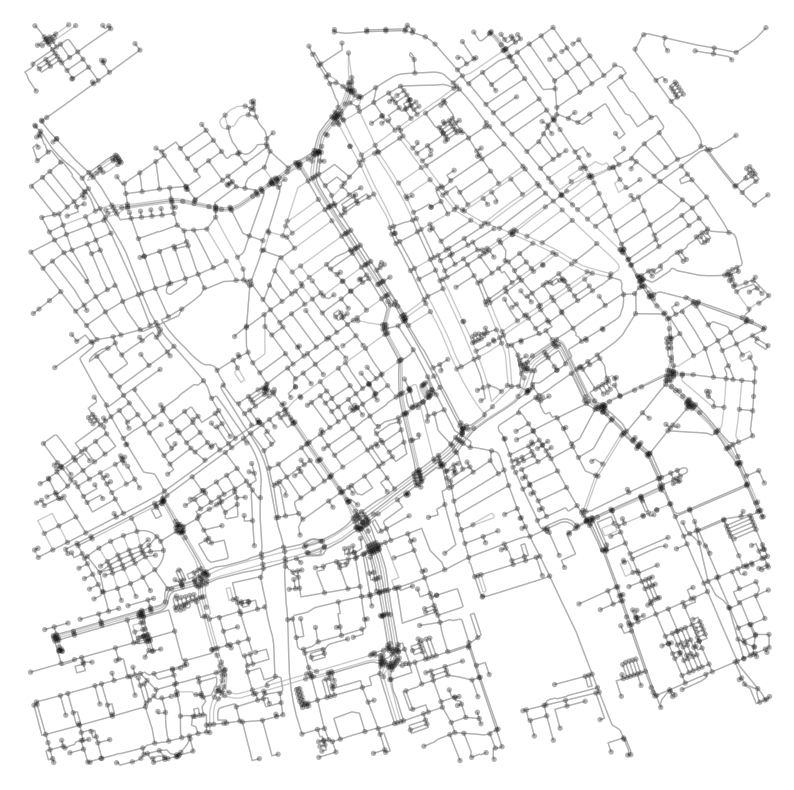

In [29]:
fig,ax = plt.subplots(figsize=(10,10))
ox.plot_graph(G_drive_proj, figsize=(10, 10), bgcolor='w', node_color='k', node_alpha = 0.3, edge_alpha = 0.5, ax=ax, show=False)

plt.axis('off')
plt.show()

#### Temporally Saving the Graph

In [38]:
len(G_bike_proj.nodes())

3045

In [39]:
len(G_bike_proj.edges())

7609

In [45]:
with open(args.save_dir + 'bike_Grpah.p', 'wb') as fp:
  pickle.dump([G_bike, G_bike_proj], fp)

In [10]:
with open(args.save_dir + 'bike_Grpah.p', 'rb') as fp:
  G_bike, G_bike_proj = pickle.load(fp)

In [47]:
with open(args.save_dir + 'all_Grpah.p', 'wb') as fp:
  pickle.dump([G, G_proj], fp)

### Graph Statistics and Analysis

#### Basic Statistics

In [11]:
stats = ox.basic_stats(G_bike_proj)
stats

{'n': 3045,
 'm': 7609,
 'k_avg': 4.997701149425287,
 'edge_length_total': 389655.55100000073,
 'edge_length_avg': 51.209824024181984,
 'streets_per_node_avg': 2.9198686371100164,
 'streets_per_node_counts': {0: 0,
  1: 479,
  2: 30,
  3: 1827,
  4: 677,
  5: 29,
  6: 3},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.15730706075533663,
  2: 0.009852216748768473,
  3: 0.6,
  4: 0.22233169129720853,
  5: 0.009523809523809525,
  6: 0.0009852216748768472},
 'intersection_count': 2566,
 'street_length_total': 222091.5499999997,
 'street_segment_count': 4391,
 'street_length_avg': 50.57880892735133,
 'circuity_avg': 1.0489673317780452,
 'self_loop_proportion': 0.0031883397859257573}

You will notice this network has `3045` nodes and `7609` edges with an average street length of `50.6m`, average streets per node of `2.92`. The node with largest degree has 6 streets connected to it.

#### Graph Representations

Edge List

In [12]:
nx.to_pandas_edgelist(G_bike_proj)

,source,target,tunnel,name,length,highway,service,junction,geometry,bridge,access,osmid,width,oneway,reversed,maxspeed,lanes
0,26017586,7617332358,NaN,Pieterstraat,22.443,pedestrian,NaN,NaN,NaN,NaN,NaN,815610369,NaN,False,True,NaN,NaN
1,26017586,1575265113,NaN,Paradijspoort,66.658,pedestrian,NaN,NaN,"LINESTRING (4.3625014 52.0099206, 4.362374 52....",NaN,NaN,7538772,NaN,False,False,NaN,NaN
2,26017586,44841573,NaN,Paradijspoort,57.961,pedestrian,NaN,NaN,"LINESTRING (4.3625014 52.0099206, 4.3629616 52...",NaN,NaN,7538772,NaN,False,True,NaN,NaN
3,7617332358,26017586,NaN,Pieterstraat,22.443,pedestrian,NaN,NaN,NaN,NaN,NaN,815610369,NaN,False,False,NaN,NaN
4,1575265113,1575265140,NaN,Molslaan,77.434,pedestrian,NaN,NaN,"LINESTRING (4.3618939 52.0103778, 4.3626976 52...",NaN,NaN,7538771,NaN,False,False,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7604,11597514376,11597514375,NaN,NaN,34.787,service,parking_aisle,NaN,"LINESTRING (4.3379868 52.0200879, 4.3381158 52...",NaN,NaN,1247526426,NaN,False,False,NaN,NaN
7605,11734529623,11734529627,NaN,NaN,14.657,service,NaN,NaN,NaN,NaN,NaN,1262978574,NaN,False,False,30,NaN
7606,11734529623,11734529628,NaN,NaN,7.360,service,NaN,NaN,NaN,NaN,NaN,1262978574,NaN,False,True,30,NaN
7607,11734529623,11734529621,NaN,NaN,56.115,service,NaN,NaN,"LINESTRING (4.3708773 51.9991902, 4.3708543 51...",NaN,NaN,1262978571,NaN,False,True,NaN,NaN


Adjacency Matrix

In [13]:
nx.to_pandas_adjacency(G_bike_proj)

,26017586,7617332358,1575265113,44841573,27082283,5124502147,1015968754,1435380997,30578268,260123525,...,11587540793,11587540787,11587540792,11587540810,11587540799,11587540797,11597514375,11597514376,11734529623,11734529628
26017586,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7617332358,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1575265113,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
44841573,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27082283,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11587540797,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11597514375,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
11597514376,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
11734529623,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


#### Network Metrics

##### Degree

In [14]:
# some of the centrality measures are not implemented on multiGraph so first set as diGraph
DG = ox.convert.to_digraph(G_bike_proj)

In [15]:
# let's first calculate its node degree centrality
node_dc = nx.degree_centrality(DG)

# after this you need to first set the attributes back to its edge
nx.set_node_attributes(DG, node_dc,'dc')

# and turn back to multiGraph for plotting
G1 = nx.MultiGraph(DG)

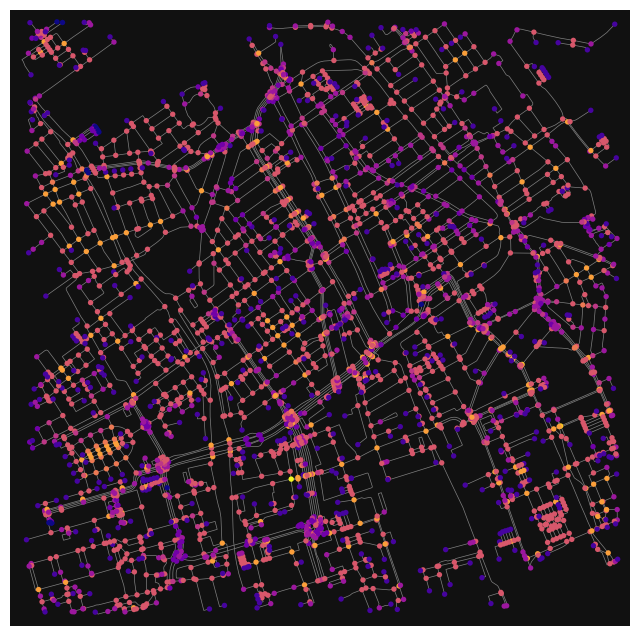

In [16]:
# you can then color the nodes in the original graph with their degree centralities
nc = ox.plot.get_node_colors_by_attr(G1, 'dc', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=15, node_color=nc,
                        edge_color='gray', edge_linewidth=0.5, edge_alpha=1)

In [17]:
# you can also calculate its edge degree centrality: convert graph into a line graph so edges become nodes and vice versa
edge_dc = nx.degree_centrality(nx.line_graph(DG))

# after this you need to first set the attributes back to its edge
nx.set_edge_attributes(DG, edge_dc,'dc')

# and turn back to multiGraph for plotting
G1 = nx.MultiGraph(DG)

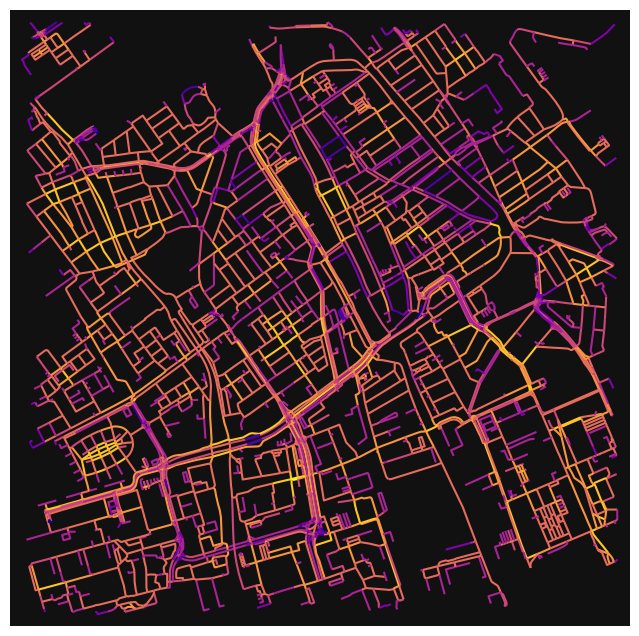

In [18]:
# you can then color the edges in the original graph with degree centralities in the line graph
nc = ox.plot.get_edge_colors_by_attr(G1, 'dc', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

##### Closeness Centrality

In [74]:
# let's first calculate its node degree centrality
node_cc = nx.closeness_centrality(DG)

# after this you need to first set the attributes back to its edge
nx.set_node_attributes(DG, node_cc,'cc')

# and turn back to multiGraph for plotting
G1 = nx.MultiGraph(DG)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


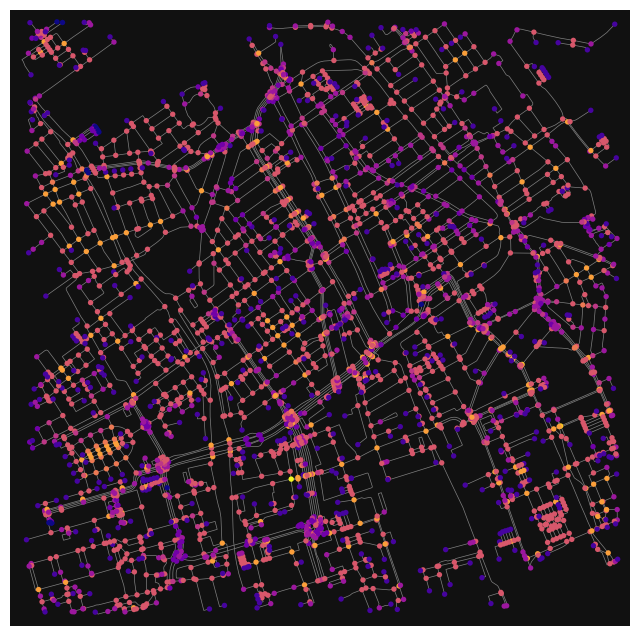

In [75]:
# you can then color the nodes in the original graph with their degree centralities
nc = ox.plot.get_node_colors_by_attr(G1, 'dc', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=15, node_color=nc,
                        edge_color='gray', edge_linewidth=0.5, edge_alpha=1)

In [76]:
# similarly, let's calculate edge closeness centrality: convert graph to a line graph so edges become nodes and vice versa
edge_cc = nx.closeness_centrality(nx.line_graph(DG))

# set or inscribe the centrality measure of each node as an edge attribute of the graph network object
nx.set_edge_attributes(DG,edge_cc,'cc')
G1 = nx.MultiGraph(DG)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


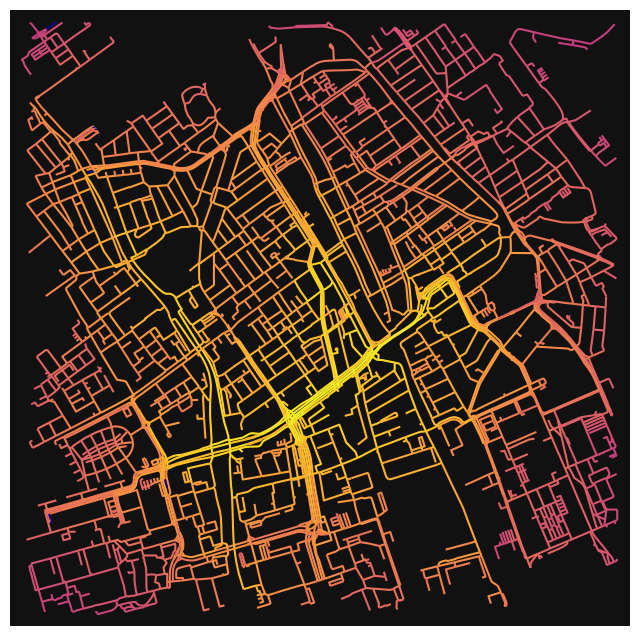

In [79]:
nc = ox.plot.get_edge_colors_by_attr(G1, 'cc', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

##### Betweenness Centrality

In [80]:
# similarly, let's calculate edge closeness centrality: convert graph to a line graph so edges become nodes and vice versa
edge_bc = nx.betweenness_centrality(nx.line_graph(DG))

# set or inscribe the centrality measure of each node as an edge attribute of the graph network object
nx.set_edge_attributes(DG,edge_bc,'bc')
G1 = nx.MultiGraph(DG)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


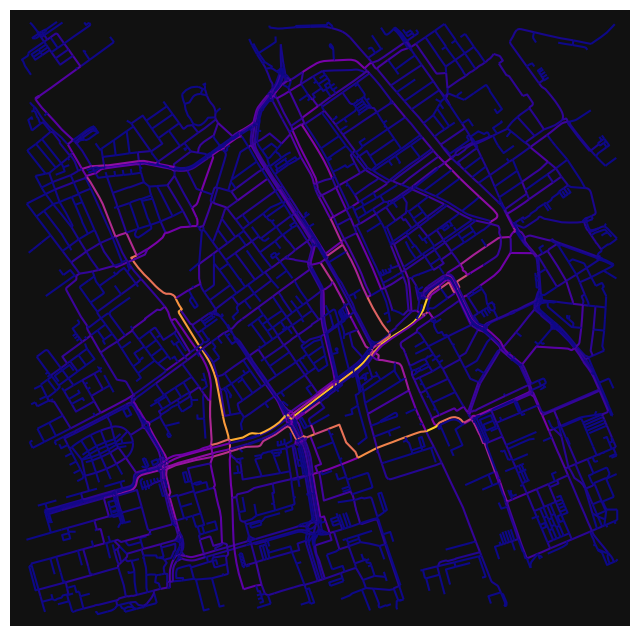

In [81]:
nc = ox.plot.get_edge_colors_by_attr(G1, 'bc', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

##### PageRank

In [19]:
# let's first calculate its node degree centrality
node_pr = nx.pagerank(DG)

# after this you need to first set the attributes back to its edge
nx.set_node_attributes(DG, node_pr,'pr')

# and turn back to multiGraph for plotting
G1 = nx.MultiGraph(DG)

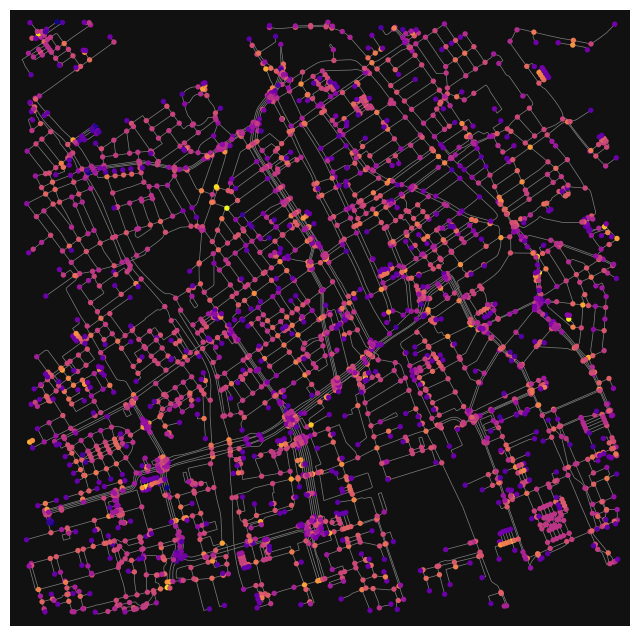

In [21]:
nc = ox.plot.get_node_colors_by_attr(G1, 'pr', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=15, node_color=nc,
                        edge_color='gray', edge_linewidth=0.5, edge_alpha=1)

In [23]:
# similarly, let's calculate edge closeness centrality: convert graph to a line graph so edges become nodes and vice versa
edge_pr = nx.pagerank(nx.line_graph(DG))

# set or inscribe the centrality measure of each node as an edge attribute of the graph network object
nx.set_edge_attributes(DG,edge_pr,'pr')
G1 = nx.MultiGraph(DG)

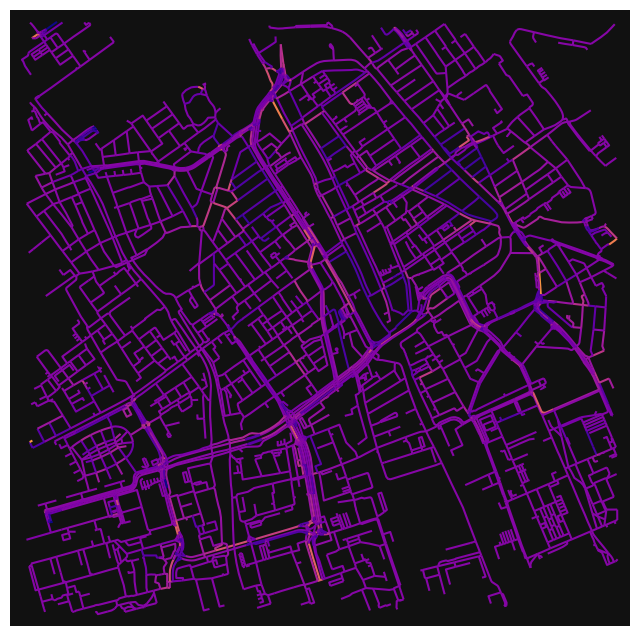

In [24]:
nc = ox.plot.get_edge_colors_by_attr(G1, 'pr', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

### Additional Downloading of Social Media Posts

#### Preparations

In [25]:
!pip install flickrapi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.0 MB/s eta 0:00:00


In [59]:
import flickrapi
import json
import os
from keras.preprocessing import image
from keras.applications.imagenet_utils import decode_predictions, preprocess_input
from keras.models import Model

In [34]:
args = Namespace(
    # Please paste your API key and secret in your Google Colab environment
    api_key = u'{}'.format(userdata.get('api_key')),
    api_secret = u'{}'.format(userdata.get('api_secret')),
    # Please paste the geolocation of your case study city here
    lat = 52.00667,
    lon = 4.3556,
    # The radius is in the unit of km
    radius = 1,
    save_dir = folder + 'data_storage/',
    image_dir = folder + 'data_storage/images/',
    # Set a limit to the images to be collected
    maximum_images = 3000,
    tags=[],
)

In [28]:
args.save_dir

'/content/drive/MyDrive/FCIC_workshop/Delf Campus/'

In [29]:
def collect_ids(flickr, lat, lon, radius, tags = None):

    if 'photo_ids.csv' in [files for root, dirs, files in os.walk(args.save_dir)][0]:
        Ids = pd.read_csv(args.save_dir+'photo_ids.csv', sep='\t')['ids'].tolist()
    else:
        Ids = []

    walk = flickr.walk(has_geo = 1, lat = args.lat, lon = args.lon, radius = args.radius, tags=args.tags)
    for photo in walk:
        id_now = photo.get('id')
        if id_now in Ids:
            continue
        Ids.append(id_now)
        if len(Ids)%50 == 0:
            print('{} photo ids collected'.format(len(Ids)))
            pd.Series(Ids, name = 'ids').to_csv(args.save_dir + 'photo_ids.csv', index=False)
        if len(Ids)>=args.maximum_images:
          break
    pd.Series(Ids, name = 'ids').to_csv(args.save_dir + 'photo_ids.csv', index=False)
    return Ids

def get_photos(flickr, Photos, Ids):
    processed = Photos.keys()
    for id_now in Ids:
        if id_now in processed:
            continue
        else:
            Photos[id_now] = {}
            sizes = json.loads(flickr.photos.getSizes(photo_id = id_now, format='json'))
            info = json.loads(flickr.photos.getInfo(photo_id = id_now, format='json'))
            try:
                url_c = sizes['sizes']['size'][-2]['source']
                url_q = sizes['sizes']['size'][1]['source']
                can = sizes['sizes']['candownload']
                Photos[id_now]['candownload'] = can
                Photos[id_now]['url_q'] = url_q
                Photos[id_now]['owner'] = info['photo']['owner']['nsid']
                Photos[id_now]['owner_loc'] = info['photo']['owner']['location']
                Photos[id_now]['title'] = info['photo']['title']['_content']
                Photos[id_now]['description'] = info['photo']['description']['_content']
                Photos[id_now]['comments'] = info['photo']['comments']['_content']
                Photos[id_now]['taken'] = info['photo']['dates']['taken']
                Photos[id_now]['views'] = info['photo']['views']
                Photos[id_now]['people'] = info['photo']['people']['haspeople']
                Photos[id_now]['tags'] = info['photo']['tags']['tag']
                Photos[id_now]['lat'] = info['photo']['location']['latitude']
                Photos[id_now]['lon'] = info['photo']['location']['longitude']
                Photos[id_now]['neighbourhood'] = info['photo']['location']['neighbourhood']['_content']
                Photos[id_now]['url'] = info['photo']['urls']['url'][0]['_content']

                if can:
                    urllib.request.urlretrieve(url_q, args.image_dir+'{}.jpg'.format(id_now))

                if len(processed)%50 ==0:
                    print('{}/{} photos collected'.format(len(processed),len(Ids)))
                    with open(args.image_dir+'Photo_sizes.p', 'wb') as fp:
                        pickle.dump(Photos,fp, protocol=pickle.HIGHEST_PROTOCOL)
                    photo_df = pd.DataFrame(Photos).T
                    photo_df.to_csv(args.image_dir+'photos_sizes.csv', sep='\t',encoding='utf-8-sig')
            except:
                print(id_now)
                continue

    with open(args.image_dir+'Photo_sizes.p', 'wb') as fp:
        pickle.dump(Photos,fp, protocol=pickle.HIGHEST_PROTOCOL)
    photo_df = pd.DataFrame(Photos).T
    photo_df.to_csv(args.image_dir+'photos_sizes.csv', sep='\t',encoding='utf-8-sig')
    return Photos


def load_image(path):
    img = image.load_img(path, target_size=[224,224])
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    #x = preprocess_input(x)
    return img, x


def get_closest_images(query_image_idx, num_results=5):
    distances = [ distance.cosine(pca_features[query_image_idx], feat) for feat in pca_features ]
    idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[1:num_results+1]
    return idx_closest

def get_concatenated_images(indexes, thumb_height):
    thumbs = []
    for idx in indexes:
        img = image.load_img(images[idx])
        img = img.resize((int(img.width * thumb_height / img.height), thumb_height))
        thumbs.append(img)
    concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)
    return concat_image

#### Data Collection

In [37]:
flickr = flickrapi.FlickrAPI(args.api_key, args.api_secret)
if not 'data_storage' in os.listdir(folder):
  os.mkdir(args.save_dir)
Ids = collect_ids(flickr, args.lat, args.lon, args.radius, args.tags)

3000 photo ids collected


In [38]:
len(Ids)

3000

In [39]:
if not 'images' in os.listdir(args.save_dir):
  os.mkdir(args.image_dir)

if 'Photo_sizes.p' in [files for root, dirs, files in os.walk(args.image_dir)][0]:
  with open(args.image_dir+'Photo_sizes.p', 'rb') as fp:
      Photos = pickle.load(fp)
else:
  Photos = {}
  Photos = get_photos(flickr, Photos, Ids)

50/3000 photos collected
100/3000 photos collected
150/3000 photos collected
200/3000 photos collected
250/3000 photos collected
300/3000 photos collected
350/3000 photos collected
400/3000 photos collected
450/3000 photos collected
500/3000 photos collected
550/3000 photos collected
600/3000 photos collected
650/3000 photos collected
700/3000 photos collected
750/3000 photos collected
800/3000 photos collected
850/3000 photos collected
900/3000 photos collected
950/3000 photos collected
1000/3000 photos collected
1050/3000 photos collected
1100/3000 photos collected
1150/3000 photos collected
1200/3000 photos collected
1250/3000 photos collected
1300/3000 photos collected
1350/3000 photos collected
1400/3000 photos collected
1450/3000 photos collected
1500/3000 photos collected
1550/3000 photos collected
1600/3000 photos collected
1650/3000 photos collected
1700/3000 photos collected
1750/3000 photos collected
1800/3000 photos collected
1850/3000 photos collected
1900/3000 photos coll

In [40]:
len(Photos)

3000

In [41]:
img_df = pd.read_csv(args.image_dir+'photos_sizes.csv',sep='\t').rename(columns={'Unnamed: 0':'ids'})
img_df.head()

,ids,candownload,url_q,owner,owner_loc,title,description,comments,taken,views,people,tags,lat,lon,neighbourhood,url
0,53653135424,0,https://live.staticflickr.com/65535/5365313542...,13735648@N05,"Rotterdam, Netherlands",NaN,NaN,0,2024-04-12 22:23:16,0,0,"[{'id': '13730308-53653135424-536', 'author': ...",52.009777,4.355577,NaN,https://www.flickr.com/photos/seustace2003/536...
1,53651915732,0,https://live.staticflickr.com/65535/5365191573...,13735648@N05,"Rotterdam, Netherlands",NaN,NaN,0,2024-04-12 22:23:31,0,0,"[{'id': '13730308-53651915732-536', 'author': ...",52.009777,4.355577,NaN,https://www.flickr.com/photos/seustace2003/536...
2,53653006528,0,https://live.staticflickr.com/65535/5365300652...,13735648@N05,"Rotterdam, Netherlands",NaN,NaN,0,2024-04-12 22:29:50,0,0,"[{'id': '13730308-53653006528-536', 'author': ...",52.009777,4.355577,NaN,https://www.flickr.com/photos/seustace2003/536...
3,53653135324,0,https://live.staticflickr.com/65535/5365313532...,13735648@N05,"Rotterdam, Netherlands",NaN,NaN,0,2024-04-12 22:29:32,0,0,"[{'id': '13730308-53653135324-536', 'author': ...",52.009777,4.355577,NaN,https://www.flickr.com/photos/seustace2003/536...
4,53653006463,0,https://live.staticflickr.com/65535/5365300646...,13735648@N05,"Rotterdam, Netherlands",NaN,NaN,0,2024-04-12 22:29:57,0,0,"[{'id': '13730308-53653006463-536', 'author': ...",52.009777,4.355577,NaN,https://www.flickr.com/photos/seustace2003/536...


In [42]:
img_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ids            3000 non-null   int64  
 1   candownload    3000 non-null   int64  
 2   url_q          3000 non-null   object 
 3   owner          3000 non-null   object 
 4   owner_loc      2233 non-null   object 
 5   title          1861 non-null   object 
 6   description    1037 non-null   object 
 7   comments       3000 non-null   int64  
 8   taken          3000 non-null   object 
 9   views          3000 non-null   int64  
 10  people         3000 non-null   int64  
 11  tags           3000 non-null   object 
 12  lat            3000 non-null   float64
 13  lon            3000 non-null   float64
 14  neighbourhood  0 non-null      float64
 15  url            3000 non-null   object 
dtypes: float64(3), int64(5), object(8)
memory usage: 375.1+ KB


In [43]:
img_df['candownload'].sum()

1790

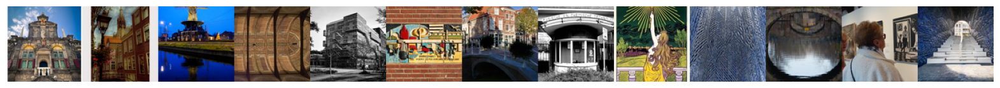

In [47]:
# load all the similarity results as thumbnails of height 100
thumbs = []
for idx in img_df[img_df['views']>img_df['views'].quantile(0.99)].sort_values(by='views', ascending=False)['ids']:
    try:
        img = image.load_img(args.image_dir+str(idx)+'.jpg')
        img = img.resize((int(img.width * 100 / img.height), 100))
        thumbs.append(img)
    except:
        continue

# concatenate the images into a single image
concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)

# show the image
plt.figure(figsize = (20,12))
plt.axis('off')
plt.imshow(concat_image)

In [48]:
img_df['owner_loc'].unique()

array(['Rotterdam, Netherlands', nan, 'Delft, Netherlands', 'Pau, France',
       'delft, the Netherlands', 'Netherlands', 'Den Haag, Netherlands',
       'London, England, United Kingdom', 'Lanaken, Belgie',
       'Düsseldorf-Hubbelrath, Deutschland / Germany',
       'Amsterdam Haarlem Nederland, Netherlands', 'Breda, Netherlands',
       'The Netherlands', 'Amsterdam, Netherlands', 'Köln, Deutschland',
       'Nantes, France', 'Roma, Italy', 'Aosta, Italia', 'Kissimmee, USA',
       'Province Limburg, The Netherlands', 'Oldehove, Netherlands',
       'Nieuwerkerk aan den IJssel, The Netherlands', 'Voorburg',
       'Croydon', 'Guadix (Granada), Spain', 'Scottsdale, AZ, USA',
       'Chattanooga, TN, United States', 'NL', 'delft / netherlands',
       'Delft, The Netherlands', 'São Paulo, Brazil',
       'Amersfoort, Netherlands', 'Essen, Germany', 'Belgium',
       'Naaldwijk, Netherlands', 'London, UK', 'Mönchengadbach',
       'Voerendaal, Netherlands', 'Hoofddorp, Netherlands',


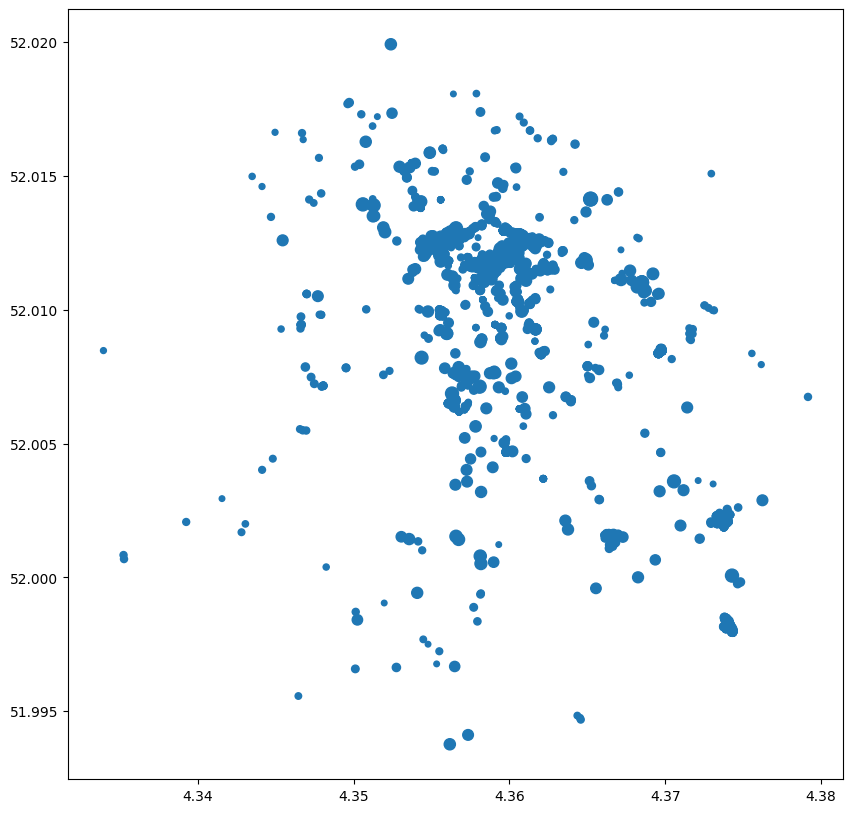

In [49]:
plt.figure(figsize=(10,10))
plt.scatter(img_df['lon'],img_df['lat'], s=10*np.log(img_df['views']+5))

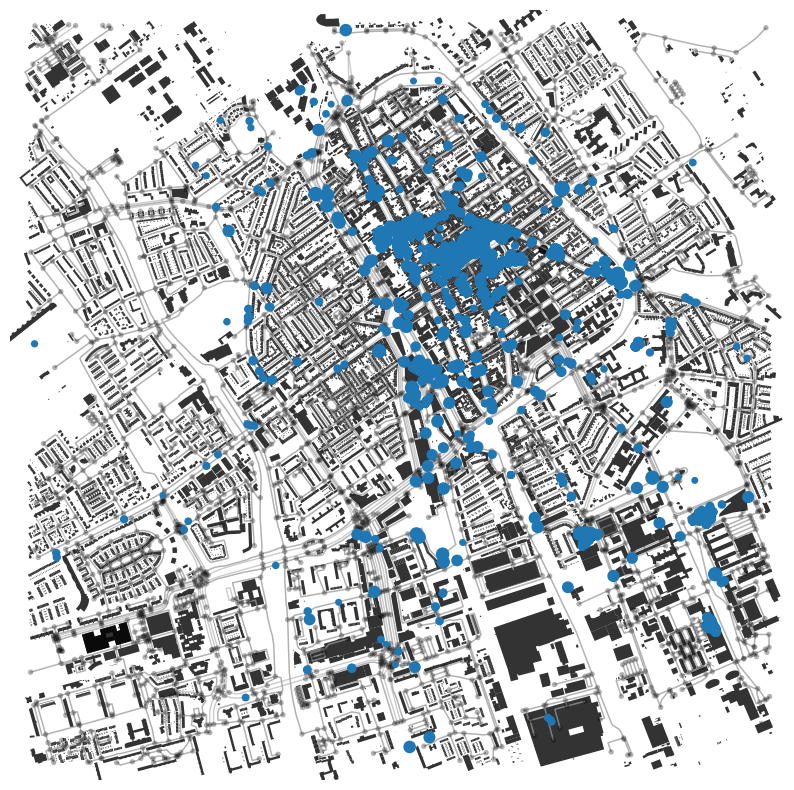

In [52]:
fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['building'].notna()].plot(ax=ax,color='black', alpha=0.8)
ox.plot_graph(G_bike_proj, figsize=(10, 10), bgcolor='w', node_color='k', node_alpha = 0.3, edge_alpha = 0.5, ax=ax, show=False)

ax.scatter(img_df['lon'],img_df['lat'], s=10*np.log(img_df['views']+5))
plt.axis('off')
plt.show()

In [53]:
img_df['date'] = img_df['taken'].apply(lambda x: int(x[:4]))

In [54]:
img_df['date'].describe()

count    3000.000000
mean     2023.168333
std         1.412797
min      1975.000000
25%      2023.000000
50%      2023.000000
75%      2024.000000
max      2024.000000
Name: date, dtype: float64

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


<Axes: >

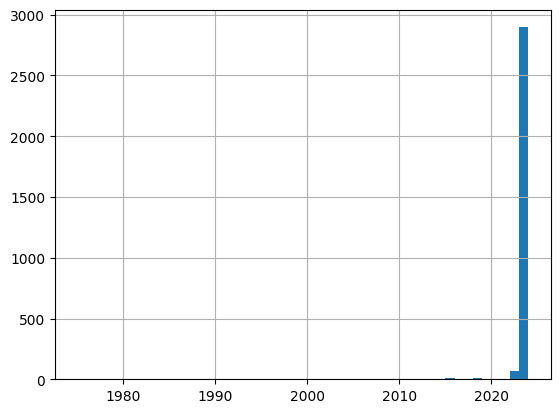

In [55]:
img_df['date'].hist(bins=img_df['date'].max() - img_df['date'].min())

### Image Processing using AI Models

#### Loading a Pre-Trained Computer Vision Model

In [60]:
from tensorflow.keras.applications.vgg16 import VGG16
model = VGG16(weights='imagenet', include_top=True)

In [57]:
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

#### Extrating the Visual Features of Images

In [61]:
feat_extractor = Model(inputs=model.input, outputs=model.get_layer("fc2").output)

In [62]:
image_extensions = ['.jpg', '.png', '.jpeg']   # case-insensitive (upper/lower doesn't matter)
max_num_images = 10000

images = [os.path.join(dp, f) for dp, dn, filenames in os.walk(args.image_dir) for f in filenames if os.path.splitext(f)[1].lower() in image_extensions]
if max_num_images < len(images):
    images = [images[i] for i in sorted(random.sample(xrange(len(images)), max_num_images))]

print("keeping %d images to analyze" % len(images))

keeping 1790 images to analyze


In [63]:
import time
tic = time.perf_counter()

features = []
for i, image_path in enumerate(images):
    if i % 50 == 0:
        toc = time.perf_counter()
        elap = toc-tic;
        print("analyzing image %d / %d. Time: %4.4f seconds." % (i, len(images),elap))
        tic = time.perf_counter()
    img, x = load_image(image_path);
    feat = feat_extractor.predict(x, verbose=False)[0]
    features.append(feat)

print('finished extracting features for %d images' % len(images))

analyzing image 0 / 1790. Time: 0.0003 seconds.


KeyboardInterrupt: 

In [ ]:
feat.shape

(4096,)

The images are represented as a 4096-dimensional vector

#### Dimensionality Reduction

We can then reduce the dimensions of image features to 100-dimension using Principal Component Analysis...

In [ ]:
from sklearn.decomposition import PCA

features = np.array(features)
pca = PCA(n_components=100)
pca.fit(features)

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


PCA(n_components=100)

In [ ]:
pca_features = pca.transform(features)

In [ ]:
features.shape

(208, 4096)

In [ ]:
pca_features.shape

(208, 100)

In [ ]:
with open(args.save_dir + 'feature_PCA.p', 'wb') as fp:
  pickle.dump([images, pca_features, pca], fp)

#### Image Extraction

We can already use this reduced feature to extrac close images to any sample

Text(0.5, 1.0, 'query image (186)')

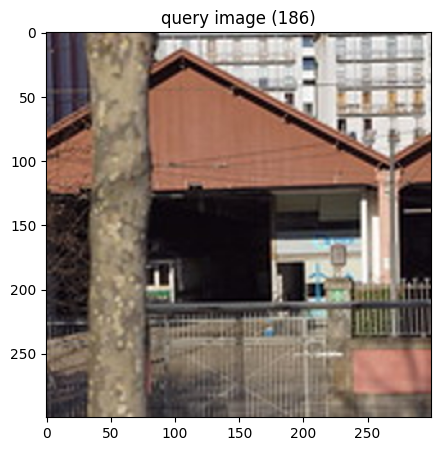

In [ ]:
# do a query on a random image
query_image_idx = int(len(images) * random.random())
idx_closest = get_closest_images(query_image_idx)
query_image = get_concatenated_images([query_image_idx], 300)
results_image = get_concatenated_images(idx_closest, 200)

# display the query image
plt.figure(figsize = (5,5))
plt.imshow(query_image)
plt.title("query image (%d)" % query_image_idx)

Text(0.5, 1.0, 'result images')

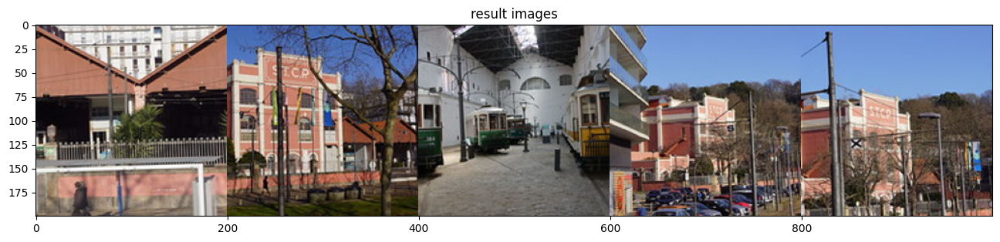

In [ ]:
# display the resulting images
plt.figure(figsize = (16,12))
plt.imshow(results_image)
plt.title("result images")

Text(0.5, 1.0, 'query image (169)')

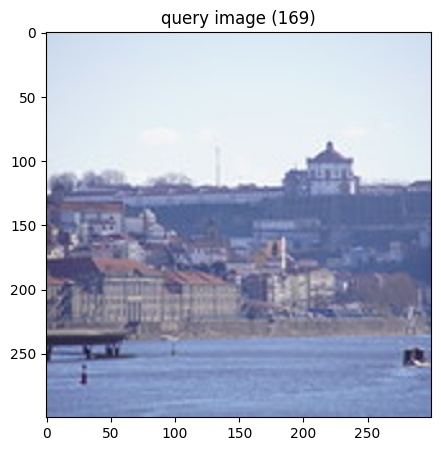

In [ ]:
# do a query on a random image
query_image_idx = int(len(images) * random.random())
idx_closest = get_closest_images(query_image_idx)
query_image = get_concatenated_images([query_image_idx], 300)
results_image = get_concatenated_images(idx_closest, 200)

# display the query image
plt.figure(figsize = (5,5))
plt.imshow(query_image)
plt.title("query image (%d)" % query_image_idx)

Text(0.5, 1.0, 'result images')

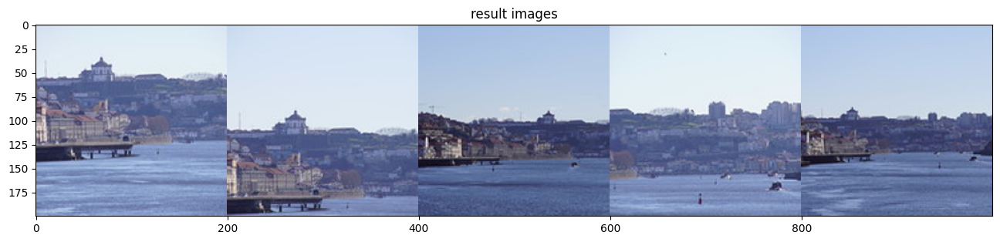

In [ ]:
# display the resulting images
plt.figure(figsize = (16,12))
plt.imshow(results_image)
plt.title("result images")

#### Using t-SNE to visualize the similarities of images on 2D

In [ ]:
with open(args.save_dir + 'feature_PCA.p', 'rb') as fp:
  images, pca_features, pca = pickle.load(fp)

In [ ]:
num_images_to_plot = 200
random.seed(1)
if len(images) > num_images_to_plot:
    sort_order = sorted(random.sample(range(len(images)), num_images_to_plot))
    images = [images[i] for i in sort_order]
    pca_features = [pca_features[i] for i in sort_order]

In [ ]:
X = np.array(pca_features)
tsne = TSNE(n_components=2, learning_rate=150, perplexity=30, angle=0.2, verbose=2).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.083s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 30.260782
[t-SNE] Computed conditional probabilities in 0.027s
[t-SNE] Iteration 50: error = 64.0051498, gradient norm = 0.3368674 (50 iterations in 0.391s)
[t-SNE] Iteration 100: error = 63.7776566, gradient norm = 0.3242003 (50 iterations in 0.293s)
[t-SNE] Iteration 150: error = 63.8155823, gradient norm = 0.3427885 (50 iterations in 0.220s)
[t-SNE] Iteration 200: error = 69.5600433, gradient norm = 0.2836042 (50 iterations in 0.455s)
[t-SNE] Iteration 250: error = 63.2207642, gradient norm = 0.3171518 (50 iterations in 0.241s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.220764
[t-SNE] Iteration 300: error = 0.5426528, gradient norm = 0.0064189 (50 iterations in 0.204s)
[t-SNE] Iteration 350: error = 0.4682170, gradient norm = 0.0014810 

In [ ]:
len(X)

200

In [ ]:
tx, ty = tsne[:,0], tsne[:,1]
tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

<ipython-input-59-809a09023e91>:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)


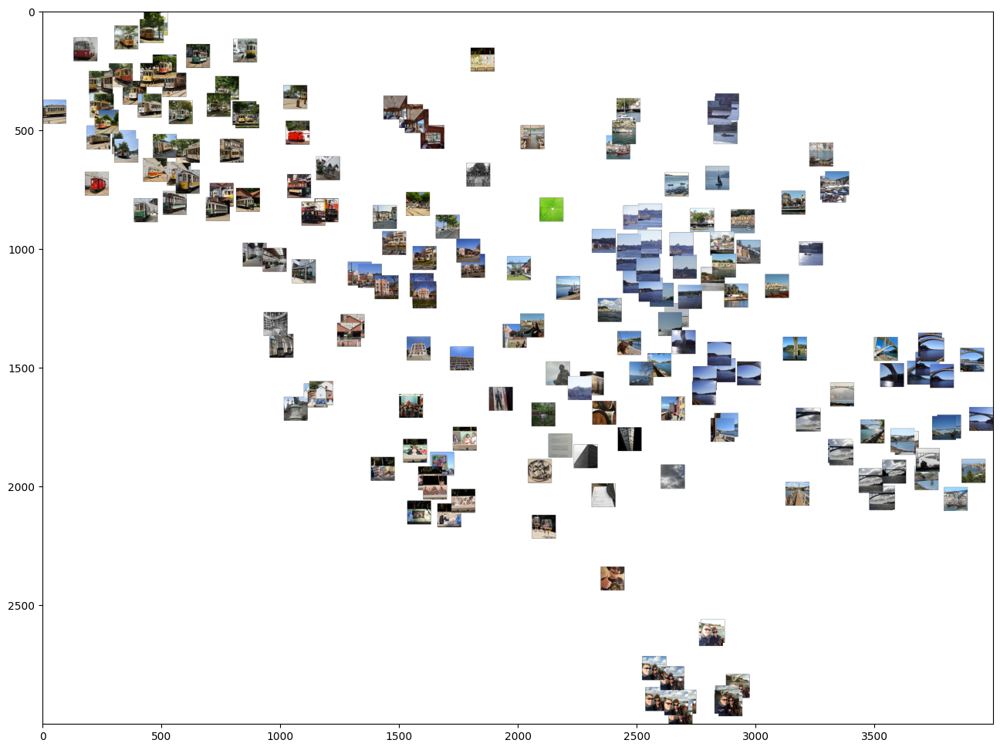

In [ ]:
width = 4000
height = 3000
max_dim = 100

full_image = Image.new('RGBA', (width, height))
for img, x, y in zip(images, tx, ty):
    tile = Image.open(img)
    rs = max(1, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile.convert('RGBA'))

plt.figure(figsize = (16,12))
plt.imshow(full_image)

In [ ]:
full_image.save(args.save_dir + "tSNE_200.png")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
tsne_path = args.save_dir + "tSNE_200.json"

data = [{"path":os.path.abspath(img), "point":[float(x), float(y)]} for img, x, y in zip(images, tx, ty)]
with open(tsne_path, 'w') as outfile:
    json.dump(data, outfile)

print("saved t-SNE result to %s" % tsne_path)

saved t-SNE result to /content/drive/MyDrive/FCIC_workshop/FAUP_Porto/data_storage/tSNE_200.json


#### Stretching the TSNE visualization into a grid

In [ ]:
import rasterfairy

# nx * ny = 200, the number of images
nx = 20
ny = 10

# assign to grid
grid_assignment = rasterfairy.transformPointCloud2D(tsne, target=(nx, ny))

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
/usr/local/lib/python3.10/dist-packages/rasterfairy/rasterfairy.py:134: DeprecationWarning: `np.float` is a deprecated alias for the bu

<ipython-input-61-65f548a41a6a>:22: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  tile = tile.resize((tile_width, tile_height), Image.ANTIALIAS)


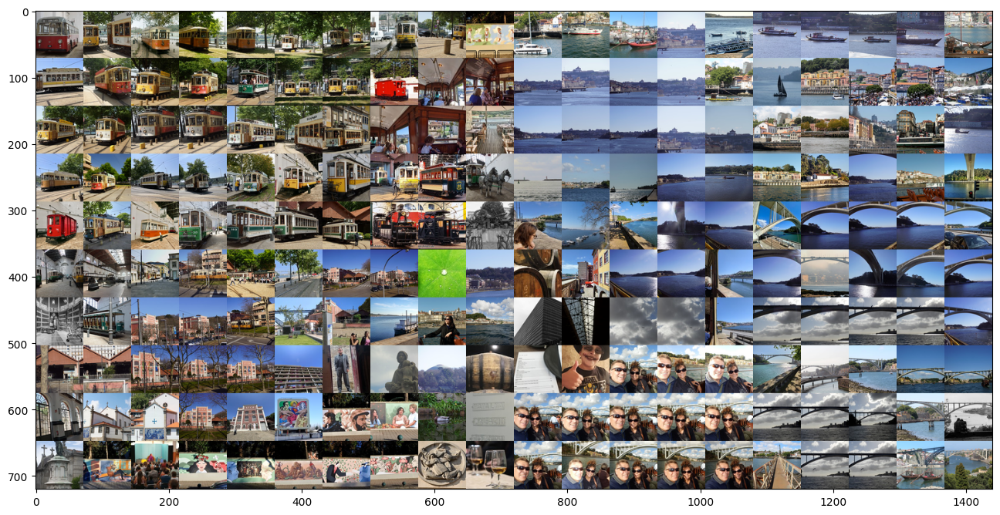

In [ ]:
tile_width = 72
tile_height = 72

full_width = tile_width * nx
full_height = tile_height * ny
aspect_ratio = float(tile_width) / tile_height

grid_image = Image.new('RGB', (full_width, full_height))

for img, grid_pos in zip(images, grid_assignment[0]):
    idx_x, idx_y = grid_pos
    x, y = tile_width * idx_x, tile_height * idx_y

    tile = Image.open(img)
    tile_ar = float(tile.width) / tile.height  # center-crop the tile to match aspect_ratio
    if (tile_ar > aspect_ratio):
        margin = 0.5 * (tile.width - aspect_ratio * tile.height)
        tile = tile.crop((margin, 0, margin + aspect_ratio * tile.height, tile.height))
    else:
        margin = 0.5 * (tile.height - float(tile.width) / aspect_ratio)
        tile = tile.crop((0, margin, tile.width, margin + float(tile.width) / aspect_ratio))
    tile = tile.resize((tile_width, tile_height), Image.ANTIALIAS)
    grid_image.paste(tile, (int(x), int(y)))

plt.figure(figsize = (16,12))
plt.imshow(grid_image)

In [ ]:
grid_image.save(args.save_dir + "grid_200.jpg")

This is a collage with very small number of images. If extended to larger number, images with much more insights can be generated.

See the following an example created with 1000 images in Testaccio area in Rome (Bai et al., 2023).

![<img src="image.png" width="2000"/>](https://drive.google.com/uc?id=1RHQ_MKroe6WSJLLjBZ88dNiGTgEkMBHq)



### Text Processing using AI Models

#### Preprocessing of Textual Information

A subset that has textual information of Description, Title, and Tags

In [ ]:
img_df['tag_list'] = img_df['tags'].apply(lambda x: re.findall(r'_content\': \'([a-zA-Z]+)',x))
img_df['tag_len'] = img_df['tag_list'].apply(lambda x: len(x))

In [ ]:
df_new = img_df[~((img_df['description'].isnull())|(img_df['title'].isnull())|(img_df['tag_len']==0))]
df_new

,ids,candownload,url_q,owner,owner_loc,title,description,comments,taken,views,people,tags,lat,lon,neighbourhood,url,date,tag_list,tag_len
0,53440346026,0,https://live.staticflickr.com/65535/5344034602...,48597791@N04,NaN,Tram 131 at Massarelos,Porto,0,2023-05-13 18:42:17,82,0,"[{'id': '48565652-53440346026-32298', 'author'...",41.147397,-8.633303,Massarelos,https://www.flickr.com/photos/ernstkers/534403...,2023,"[streetcar, trolley, strasenbahn, stcp, tram, ...",14
1,53435181869,0,https://live.staticflickr.com/65535/5343518186...,48597791@N04,NaN,Museum horse tram 8 at Arrábida,Annual Porto museumtrams parade of 2023,0,2023-05-13 15:49:09,164,0,"[{'id': '48565652-53435181869-32298', 'author'...",41.148547,-8.641056,NaN,https://www.flickr.com/photos/ernstkers/534351...,2023,"[streetcar, trolley, strasenbahn, stcp, tram, ...",16
2,53424054099,0,https://live.staticflickr.com/65535/5342405409...,48597791@N04,NaN,Zorra 58 at Massarelos,At the end of the annual Porto museumtrams par...,0,2023-05-13 17:44:15,231,0,"[{'id': '48565652-53424054099-32298', 'author'...",41.147552,-8.633748,Massarelos,https://www.flickr.com/photos/ernstkers/534240...,2023,"[streetcar, trolley, strasenbahn, zorra, stcp,...",15
3,53417600202,0,https://live.staticflickr.com/65535/5341760020...,48597791@N04,NaN,Museumtram 100 at Arrábida,Annual Porto museumtrams parade of 2023,0,2023-05-13 15:50:00,148,0,"[{'id': '48565652-53417600202-32298', 'author'...",41.148613,-8.641064,NaN,https://www.flickr.com/photos/ernstkers/534176...,2023,"[streetcar, trolley, strasenbahn, stcp, tram, ...",14
4,53413760498,0,https://live.staticflickr.com/65535/5341376049...,48597791@N04,NaN,Musemtram 104 at Massarelos,In advance of the 2023 Porto annual museum tra...,0,2023-05-13 14:39:21,165,0,"[{'id': '48565652-53413760498-32298', 'author'...",41.145961,-8.631125,Massarelos,https://www.flickr.com/photos/ernstkers/534137...,2023,"[streetcar, trolley, strasenbahn, tram, sp, bo...",14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439,53402187150,0,https://live.staticflickr.com/65535/5340218715...,48597791@N04,NaN,Museumtram 247 at Massarelos,At the end of the annual Porto museumtrams par...,0,2023-05-13 18:56:57,190,0,"[{'id': '48565652-53402187150-32298', 'author'...",41.147377,-8.633123,Massarelos,https://www.flickr.com/photos/ernstkers/534021...,2023,"[streetcar, trolley, strasenbahn, tram, sp, bo...",14
444,53396027508,0,https://live.staticflickr.com/65535/5339602750...,48597791@N04,NaN,Museumtram 274 at Arrábida,Annual Porto museumtrams parade of 2023,0,2023-05-13 15:51:06,236,0,"[{'id': '48565652-53396027508-32298', 'author'...",41.148558,-8.641056,NaN,https://www.flickr.com/photos/ernstkers/533960...,2023,"[streetcar, trolley, strasenbahn, tram, sp, bo...",14
445,53382261598,0,https://live.staticflickr.com/65535/5338226159...,48597791@N04,NaN,Museumtram 315 at Arrábida,Annual Porto museumtrams parade of 2023,0,2023-05-13 15:50:45,223,0,"[{'id': '48565652-53382261598-32298', 'author'...",41.148575,-8.641056,NaN,https://www.flickr.com/photos/ernstkers/533822...,2023,"[streetcar, trolley, strasenbahn, stcp, tram, ...",14
446,53376124675,0,https://live.staticflickr.com/65535/5337612467...,48597791@N04,NaN,Tram 191 at Massarelos,"Porto, the tram is going to enter the depot.",0,2023-05-13 18:58:07,215,0,"[{'id': '48565652-53376124675-32298', 'author'...",41.147352,-8.633106,Massarelos,https://www.flickr.com/photos/ernstkers/533761...,2023,"[streetcar, trolley, strasenbahn, tram, sp, bo...",13


In [ ]:
df_new['tag_text'] = df_new['tag_list'].apply(lambda x: ', '.join(x))
df_new['TEXTS'] = 'Title: ' + df_new['title'] + '. Description: '+ df_new['description'] + '. Tags: '+ df_new['tag_text']

<ipython-input-64-477ab344b044>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['tag_text'] = df_new['tag_list'].apply(lambda x: ', '.join(x))
<ipython-input-64-477ab344b044>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['TEXTS'] = 'Title: ' + df_new['title'] + '. Description: '+ df_new['description'] + '. Tags: '+ df_new['tag_text']


In [ ]:
df_new['TEXTS'].iloc[10]

'Title: Museumtrams 274 and 58 at Massarelos. Description: At the end of the annual Porto museumtrams parade of 2023.. Tags: streetcar, trolley, strasenbahn, zorra, stcp, tram, sp, bonde, stcp, stcp, portugal, el, porto, publictransport, tranvia, tramvia'

In [ ]:
candidates = df_new['TEXTS'].drop_duplicates(keep='first')
len(candidates)

98

In [ ]:
candidates

0      Title: Tram 131 at Massarelos. Description: Po...
1      Title: Museum horse tram 8 at Arrábida. Descri...
2      Title: Zorra 58 at Massarelos. Description: At...
3      Title: Museumtram 100 at Arrábida. Description...
4      Title: Musemtram 104 at Massarelos. Descriptio...
                             ...                        
394    Title: Tram no.216 ascends Rua da Restauração....
395    Title: Tram 104 at Arrabida. Description: Annu...
397    Title: Portugal - Porto. Description: Cemitéri...
398    Title: Favolaschia calocera. Description: Fung...
399    Title: Clathrus ruber. Description: Fungos do ...
Name: TEXTS, Length: 98, dtype: object

#### Applying Sentiment Analysis

We define a function analyze_sentiment that takes a text as input, uses the NLTK library to perform sentiment analysis, and classifies the sentiment as positive, negative, or neutral.
The function is applied to the 'title' column of the DataFrame.

In [ ]:
import pandas as pd

# Install necessary libraries
!pip install nltk

# Import libraries
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

# Download NLTK resources
nltk.download('vader_lexicon')

# Function for sentiment analysis
def analyze_sentiment(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_score = sid.polarity_scores(text)['compound']

    if sentiment_score >= 0.05:
        return 'Positive'
    elif sentiment_score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Apply sentiment analysis to the 'title' column
df_new['sentiment'] = df_new['TEXTS'].apply(analyze_sentiment)

# Display the DataFrame with sentiment analysis results
print("\nDataFrame with Sentiment Analysis:")
print(df_new[['TEXTS', 'sentiment']])


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!



DataFrame with Sentiment Analysis:
                                                 TEXTS sentiment
0    Title: Tram 131 at Massarelos. Description: Po...   Neutral
1    Title: Museum horse tram 8 at Arrábida. Descri...   Neutral
2    Title: Zorra 58 at Massarelos. Description: At...   Neutral
3    Title: Museumtram 100 at Arrábida. Description...   Neutral
4    Title: Musemtram 104 at Massarelos. Descriptio...   Neutral
..                                                 ...       ...
439  Title: Museumtram 247 at Massarelos. Descripti...   Neutral
444  Title: Museumtram 274 at Arrábida. Description...   Neutral
445  Title: Museumtram 315 at Arrábida. Description...   Neutral
446  Title: Tram 191 at Massarelos. Description: Po...   Neutral
449  Title: Museumtrams 274 and 58 at Massarelos. D...   Neutral

[141 rows x 2 columns]


<ipython-input-69-5f02da5b150a>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['sentiment'] = df_new['TEXTS'].apply(analyze_sentiment)


Now, we want to visualize the result with a simple bar chart.

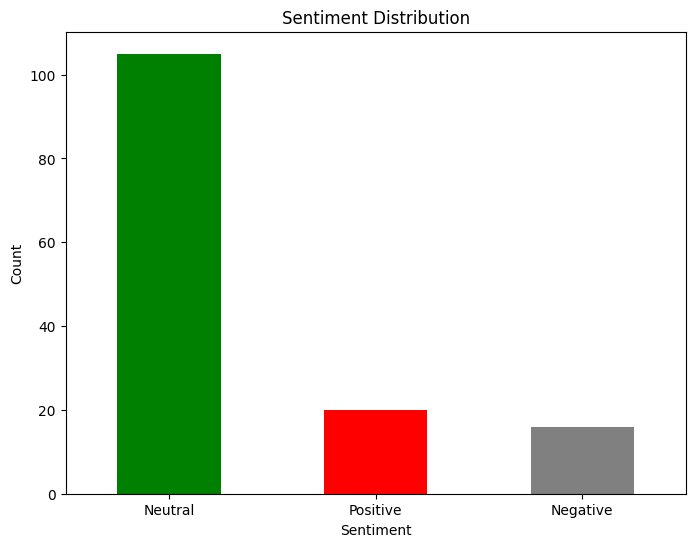

In [ ]:
    # Sentiment Analysis Visualization
    sentiment_counts = df_new['sentiment'].value_counts()

    plt.figure(figsize=(8, 6))
    sentiment_counts.plot(kind='bar', color=['gray', 'green', 'red'])
    plt.title('Sentiment Distribution')
    plt.xlabel('Sentiment')
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.show()

####Applying Named Entity Recognition (NER)

We define a function apply_ner that takes a text as input, processes it using spaCy, and extracts named entities.
Named entities are entities like persons, organizations, locations, etc.
The function is applied to the 'description' column of the DataFrame.

In [ ]:
# Install necessary libraries
!pip install spacy

# Import libraries
import spacy
import pandas as pd

# Load the spaCy English model
nlp = spacy.load("en_core_web_sm")

# Function for Named Entity Recognition (NER)
def apply_ner(text):
    doc = nlp(text)
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    return entities

# Apply NER to the 'description' column
df_new['named_entities'] = df_new['TEXTS'].apply(apply_ner)

# Display the DataFrame with NER results
print("\nDataFrame with Named Entity Recognition:")
print(df_new[['TEXTS', 'named_entities']])


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()



DataFrame with Named Entity Recognition:
                                                 TEXTS  \
0    Title: Tram 131 at Massarelos. Description: Po...   
1    Title: Museum horse tram 8 at Arrábida. Descri...   
2    Title: Zorra 58 at Massarelos. Description: At...   
3    Title: Museumtram 100 at Arrábida. Description...   
4    Title: Musemtram 104 at Massarelos. Descriptio...   
..                                                 ...   
439  Title: Museumtram 247 at Massarelos. Descripti...   
444  Title: Museumtram 274 at Arrábida. Description...   
445  Title: Museumtram 315 at Arrábida. Description...   
446  Title: Tram 191 at Massarelos. Description: Po...   
449  Title: Museumtrams 274 and 58 at Massarelos. D...   

                                        named_entities  
0    [(131, CARDINAL), (Massarelos, ORG), (portugal...  
1    [(8, CARDINAL), (Arrábida, GPE), (Annual, DATE...  
2    [(Massarelos, ORG), (annual, DATE), (Porto, GP...  
3    [(Museumtram, ORG), (100, CA

<ipython-input-72-b8ba45512f27>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['named_entities'] = df_new['TEXTS'].apply(apply_ner)


Now, we want to provide some examples and visualize the result with a simple bar chart.

2024-01-18 09:35:10.722292: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-18 09:35:10.722354: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-18 09:35:10.724138: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-18 09:35:12.800023: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 33.2 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


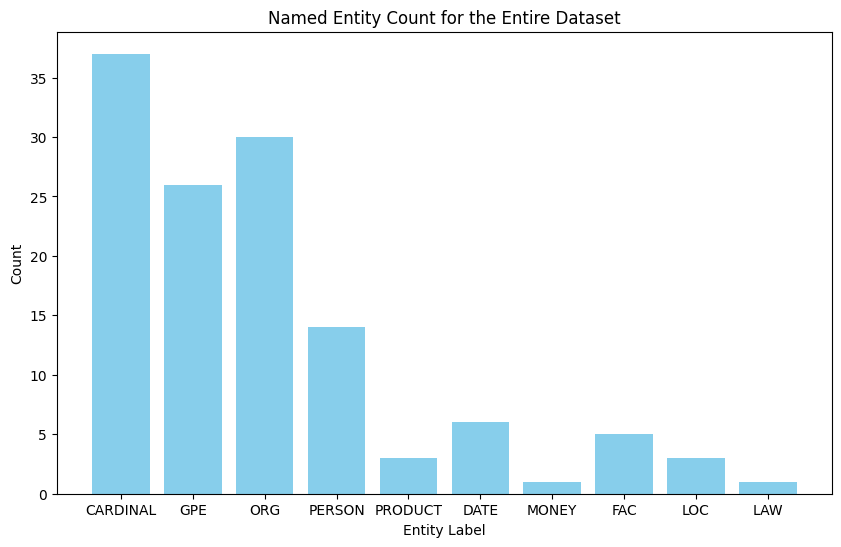


Named Entity Examples:

CARDINAL Examples:
  - 8
  - 100
  - 163
  - 247
  - 274

GPE Examples:
  - Arrábida
  - Arrábida
  - Arrábida
  - Arrábida
  - Arrábida

ORG Examples:
  - Zorra
  - Museumtram
  - Museumtram
  - Museumtram
  - Museumtram

PERSON Examples:
  - Musemtram 104
  - Almoço
  - Ponte da Arrábida
  - Joaquim Ferreira
  - Porto Tram

PRODUCT Examples:
  - 315
  - Xerocomellus
  - 315

DATE Examples:
  - 58
  - 76-2003-05-03-1-Betriebshof
  - 66-2003-05-04-1-Museum
  - 49-2003-05-04-1-Museum
  - 22-2003-05-04-1-Museum

MONEY Examples:
  - 26

FAC Examples:
  - 288
  - 288
  - 288
  - Cais das Pedras
  - Cais das Pedras

LOC Examples:
  - Douro River
  - Douro River
  - Douro River

LAW Examples:
  - Trailer 18


In [ ]:
# Importing necessary libraries
from collections import Counter
import matplotlib.pyplot as plt
import pandas as pd
import spacy

# Download spaCy English model
!python -m spacy download en_core_web_sm

# Load spaCy model
nlp = spacy.load("en_core_web_sm")

# Function for Named Entity Recognition (NER)
def apply_ner(text):
    doc = nlp(text)
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    return entities

# Function for visualizing named entities with count and examples for the entire dataset
def visualize_ner_with_count(dataset):
    # Count and examples of named entities for the entire dataset
    entity_count = Counter()
    entity_examples = {}

    for index, row in dataset.iterrows():
        doc = nlp(row['title'])
        entity_count.update([ent.label_ for ent in doc.ents])

        for ent_label in entity_count.keys():
            entity_examples.setdefault(ent_label, []).extend(
                [ent.text for ent in doc.ents if ent.label_ == ent_label][:3]
            )

    if not entity_count:
        print("No named entities found.")
        return

    # Bar chart for entity counts
    labels, counts = zip(*entity_count.items())
    plt.figure(figsize=(10, 6))
    plt.bar(labels, counts, color='skyblue')
    plt.title('Named Entity Count for the Entire Dataset')
    plt.xlabel('Entity Label')
    plt.ylabel('Count')
    plt.show()

    # Displaying 5 examples for each named entity label
    print("\nNamed Entity Examples:")
    for ent_label, examples in entity_examples.items():
        print(f"\n{ent_label} Examples:")
        for example in examples[:5]:
            print(f"  - {example}")

# Displaying the NER Visualization for the Entire Dataset
visualize_ner_with_count(df_new)

### Conclusion

Now you have the basic knowledge on how AI could be possibly use to collect social media posts from Flickr in your case study area. Keep us posted when you do find out some interesting facts.

#### Cite us as:

Bai, N., Ducci, M., Mirzikashvili, R., Nourian, P., and Pereira Roders, A.: MAPPING URBAN HERITAGE IMAGES WITH SOCIAL MEDIA DATA AND ARTIFICIAL INTELLIGENCE, A CASE STUDY IN TESTACCIO, ROME, Int. Arch. Photogramm. Remote Sens. Spatial Inf. Sci., XLVIII-M-2-2023, 139–146, https://doi.org/10.5194/isprs-archives-XLVIII-M-2-2023-139-2023, 2023.


Bai, N. (2023). Sensing the Cultural Significance with AI for Social Inclusion: A Computational Spatiotemporal Network-based Framework of Heritage Knowledge Documentation using User-Generated Content. [Dissertation (TU Delft), Delft University of Technology]. A+BE | Architecture and the Built Environment. https://doi.org/10.7480/abe.2023.17


Foroughi, M. (2023). Heritage Beyond Singular Narratives: Embracing Diversity in Participatory Heritage Planning Empowered by ­Artificial Intelligence. [Dissertation (TU Delft), Delft University of Technology]. https://doi.org/10.7480/abe.2023.19

Foroughi, M., de Andrade, B. and Roders, A.P., 2023. Capturing public voices: The role of social media in heritage management. Habitat International, 142, p.102934. https://doi.org/10.1016/j.habitatint.2023.102934

Foroughi, M., de Andrade, B. and Roders, A.P., 2022. Peoples’ values and feelings matter: participatory heritage management using social media. In Artificial Intelligence and Architectural Design: An Introduction (pp. 107-120). https://research.tudelft.nl/en/publications/peoples-values-and-feelings-matter-participatory-heritage-managem

#### Aknowledgement

Part of this notebook is based on and adapted from the notebooks by Stephen Law, Thomas Keel & Gong Jie for the course GEOG0051 Mining Social and Geographic Datasets at UCL.